# Revisit: 1990 CA Housing

An exploration into how we can use geospatial information as an added feature. We are investigating the usefulness of geospatial data on model prediction. 

_** Disclaimer: It is understood that this information may not be accurate to the year 1990 due to rezoning, boundary changes, natural geographical feature changes, etc. **_

- Incorporating geospatial data into the data set
- Including data set from 2019 CA GIS open data ([Source: data.ca.gov](https://data.ca.gov/dataset/ca-geographic-boundaries))

  - [CA State Boundary](https://data.ca.gov/dataset/ca-geographic-boundaries/resource/3db1e426-fb51-44f5-82d5-a54d7c6e188b?inner_span=True)
  - [CA County Boundary](https://data.ca.gov/dataset/ca-geographic-boundaries/resource/b0007416-a325-4777-9295-368ea6b710e6?inner_span=True)
  - [CA Places Boundary](https://data.ca.gov/dataset/ca-geographic-boundaries/resource/436fc714-831c-4070-b44b-b06dcde6bf18)

``` #machinelearning #gis #geospatial #wgs84projection #pseudomercatorprojection #geopandas #pandas ```

Choosing a coordinate system:
- [Spatial References](http://spatialreference.org)
- [EPSG](https://epsg.io)


## Importing the 1990 CA Census Housing Dataset 

In [23]:
import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import geopandas as gpd
from shapely.ops import nearest_points
import contextily as ctx
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import contextily as ctx
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['figure.figsize'] = (16,16)
# mpl.style.available
mpl.style.use('seaborn-whitegrid')

In [1]:
ocean_prox_cat = ['<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'NEAR BAY', 'ISLAND']
ocean_prox_type = CategoricalDtype(categories=ocean_prox_cat, ordered=True)

df = pd.read_csv('CAHousing1990.csv', dtype={'ocean_proximity':ocean_prox_type})
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude)) 

# WGS84 lat/lon projection
gdf.crs = 'epsg:4326'

# Convert to Pseudo-Mercator projection
gdf = gdf.to_crs('epsg:3857')
gdf.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,geometry
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,POINT (-13606581.35966183 4562487.679444513)
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,POINT (-13605468.1647539 4559667.342476101)
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,POINT (-13607694.55456976 4558257.460986449)
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,POINT (-13608807.74947769 4558257.460986449)
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,POINT (-13608807.74947769 4558257.460986449)


In [2]:
gdf.info()
# (we notice that 'total_bedrooms' may have missing values)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
longitude             20640 non-null float64
latitude              20640 non-null float64
housing_median_age    20640 non-null float64
total_rooms           20640 non-null float64
total_bedrooms        20433 non-null float64
population            20640 non-null float64
households            20640 non-null float64
median_income         20640 non-null float64
median_house_value    20640 non-null float64
ocean_proximity       20640 non-null category
geometry              20640 non-null geometry
dtypes: category(1), float64(9), geometry(1)
memory usage: 1.6 MB


In [3]:
print(f'--- Missing Values ---\n{gdf.isnull().sum()}')

--- Missing Values ---
longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
geometry                0
dtype: int64


## State Boundary Dataset

In [4]:
ca_state = gpd.read_file('CA_State/CA_State_TIGER2016.shp')
ca_state.head()

,REGION,DIVISION,STATEFP,STATENS,GEOID,STUSPS,NAME,LSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,4,9,06,01779778,06,CA,California,00,G4000,A,403501101370,20466718403,+37.1551773,-119.5434183,(POLYGON ((-13317677.37548747 3930590.80818687...


In [5]:
ca_state.crs == gdf.crs

True

## County Boundary Dataset

In [6]:
ca_counties = gpd.read_file('CA_Counties/CA_Counties_TIGER2016.shp')

# check coordinate system
ca_counties.crs == gdf.crs
# (no need to convert coordinate system)

True

In [7]:
ca_counties.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,091,00277310,06091,Sierra,Sierra County,06,H1,G4020,None,None,None,A,2468694587,23299110,+39.5769252,-120.5219926,POLYGON ((-13431319.75097945 4821511.426395644...
1,06,067,00277298,06067,Sacramento,Sacramento County,06,H1,G4020,472,40900,None,A,2499183617,76073827,+38.4500114,-121.3404409,POLYGON ((-13490651.47641084 4680831.603393857...
2,06,083,00277306,06083,Santa Barbara,Santa Barbara County,06,H1,G4020,None,42200,None,A,7084000598,2729814515,+34.5370572,-120.0399729,(POLYGON ((-13423116.77225655 4042044.14856006...
3,06,009,01675885,06009,Calaveras,Calaveras County,06,H1,G4020,None,None,None,A,2641820834,43806026,+38.1838996,-120.5614415,"POLYGON ((-13428575.483353 4627725.227535474, ..."
4,06,111,00277320,06111,Ventura,Ventura County,06,H1,G4020,348,37100,None,A,4773390489,945942791,+34.3587415,-119.1331432,(POLYGON ((-13317853.59433417 3931602.41399276...


In [8]:
# ca_counties = ca_counties[['NAMELSAD', 'geometry']].rename(columns={'NAMELSAD': 'county'})

ca_counties.columns = map(lambda x: 'county_' + str.lower(x) if x != 'geometry' else 'geometry', ca_counties.columns)
ca_counties.columns

Index(['county_statefp', 'county_countyfp', 'county_countyns', 'county_geoid',
       'county_name', 'county_namelsad', 'county_lsad', 'county_classfp',
       'county_mtfcc', 'county_csafp', 'county_cbsafp', 'county_metdivfp',
       'county_funcstat', 'county_aland', 'county_awater', 'county_intptlat',
       'county_intptlon', 'geometry'],
      dtype='object')

In [9]:
print(f'Number of Unique Counties: {ca_counties.county_name.nunique()}')
pd.DataFrame(ca_counties.county_name.unique(), columns=['unique_county'])

Number of Unique Counties: 58


,unique_county
0,Sierra
1,Sacramento
2,Santa Barbara
3,Calaveras
4,Ventura
5,Los Angeles
6,Sonoma
7,Kings
8,San Diego
9,Placer


In [10]:
# spatial join 1990 CA Housing dataset with county boundaries dataset

gdfc = gpd.sjoin(gdf, ca_counties, how='left', op='within').drop(['index_right'], axis=1)
gdfc.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,...,county_classfp,county_mtfcc,county_csafp,county_cbsafp,county_metdivfp,county_funcstat,county_aland,county_awater,county_intptlat,county_intptlon
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,...,H1,G4020,488,41860,36084,A,1.914243e+09,212979931.0,+37.6471385,-121.9124880
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,...,H1,G4020,488,41860,36084,A,1.914243e+09,212979931.0,+37.6471385,-121.9124880
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,...,H1,G4020,488,41860,36084,A,1.914243e+09,212979931.0,+37.6471385,-121.9124880
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,...,H1,G4020,488,41860,36084,A,1.914243e+09,212979931.0,+37.6471385,-121.9124880
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,...,H1,G4020,488,41860,36084,A,1.914243e+09,212979931.0,+37.6471385,-121.9124880


## CA Places Dataset

In [12]:
ca_places = gpd.read_file('CA_Places\CA_Places_TIGER2016.shp')
ca_places.head()

,STATEFP,PLACEFP,PLACENS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,PCICBSA,PCINECTA,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,66140,02411785,0666140,San Fernando,San Fernando city,25,C1,N,N,G4110,A,6148697,0,+34.2886519,-118.4362413,POLYGON ((-13186463.85473168 4067122.650716818...
1,06,14190,02409487,0614190,Cloverdale,Cloverdale city,25,C1,N,N,G4110,A,7863863,59201,+38.7959624,-123.0153700,POLYGON ((-13696207.84639312 4691208.337768598...
2,06,16560,02410240,0616560,Cotati,Cotati city,25,C1,N,N,G4110,A,4869007,8380,+38.3284920,-122.7100491,"POLYGON ((-13662197.83825167 4626644.61350646,..."
3,06,65042,02411779,0665042,San Buenaventura (Ventura),San Buenaventura (Ventura) city,25,C1,Y,N,G4110,A,56500370,27033715,+34.2677796,-119.2542062,(POLYGON ((-13280094.13783886 4075172.87791196...
4,06,30014,02410601,0630014,Glendora,Glendora city,25,C1,N,N,G4110,A,50251851,403066,+34.1449667,-117.8476672,"POLYGON ((-13123577.79273059 4048398.24812131,..."


In [13]:
print(ca_places.crs)
# (no need to convert coordinate system)

epsg:3857


In [14]:
ca_places.crs == gdf.crs

True

In [15]:
ca_places.columns = map(lambda x: 'places_' + str.lower(x) if x != 'geometry' else 'geometry', ca_places.columns)
ca_places.columns

Index(['places_statefp', 'places_placefp', 'places_placens', 'places_geoid',
       'places_name', 'places_namelsad', 'places_lsad', 'places_classfp',
       'places_pcicbsa', 'places_pcinecta', 'places_mtfcc', 'places_funcstat',
       'places_aland', 'places_awater', 'places_intptlat', 'places_intptlon',
       'geometry'],
      dtype='object')

In [16]:
# spatial join county and places dataset

ca_boundaries = gpd.sjoin(ca_places, ca_counties, how='left', op='within').drop(['index_right'], axis=1)
ca_boundaries.head()

,places_statefp,places_placefp,places_placens,places_geoid,places_name,places_namelsad,places_lsad,places_classfp,places_pcicbsa,places_pcinecta,...,county_classfp,county_mtfcc,county_csafp,county_cbsafp,county_metdivfp,county_funcstat,county_aland,county_awater,county_intptlat,county_intptlon
0,06,66140,02411785,0666140,San Fernando,San Fernando city,25,C1,N,N,...,H1,G4020,348,31080,31084,A,1.051065e+10,1.794730e+09,+34.1963983,-118.2618616
1,06,14190,02409487,0614190,Cloverdale,Cloverdale city,25,C1,N,N,...,H1,G4020,488,42220,None,A,4.081438e+09,4.975088e+08,+38.5251824,-122.9261095
2,06,16560,02410240,0616560,Cotati,Cotati city,25,C1,N,N,...,H1,G4020,488,42220,None,A,4.081438e+09,4.975088e+08,+38.5251824,-122.9261095
3,06,65042,02411779,0665042,San Buenaventura (Ventura),San Buenaventura (Ventura) city,25,C1,Y,N,...,H1,G4020,348,37100,None,A,4.773390e+09,9.459428e+08,+34.3587415,-119.1331432
4,06,30014,02410601,0630014,Glendora,Glendora city,25,C1,N,N,...,H1,G4020,348,31080,31084,A,1.051065e+10,1.794730e+09,+34.1963983,-118.2618616


In [18]:
#TODO: Feature Selection

## Geographical Visualization

In [ ]:
# Set up figure and subplots
fig, axes = plt.subplots(nrows=2)

# Plot equal interval map
districts_trees.plot(column='n_trees_per_area', scheme='equal_interval', k=5, legend=True, ax=axes[0])
axes[0].set_title('Equal Interval')
axes[0].set_axis_off()

# Plot quantiles map
districts_trees.plot(column='n_trees_per_area', scheme='quantiles', k=5, legend=True, ax=axes[1])
axes[1].set_title('Quantiles')
axes[1].set_axis_off()

# Display maps
plt.show()

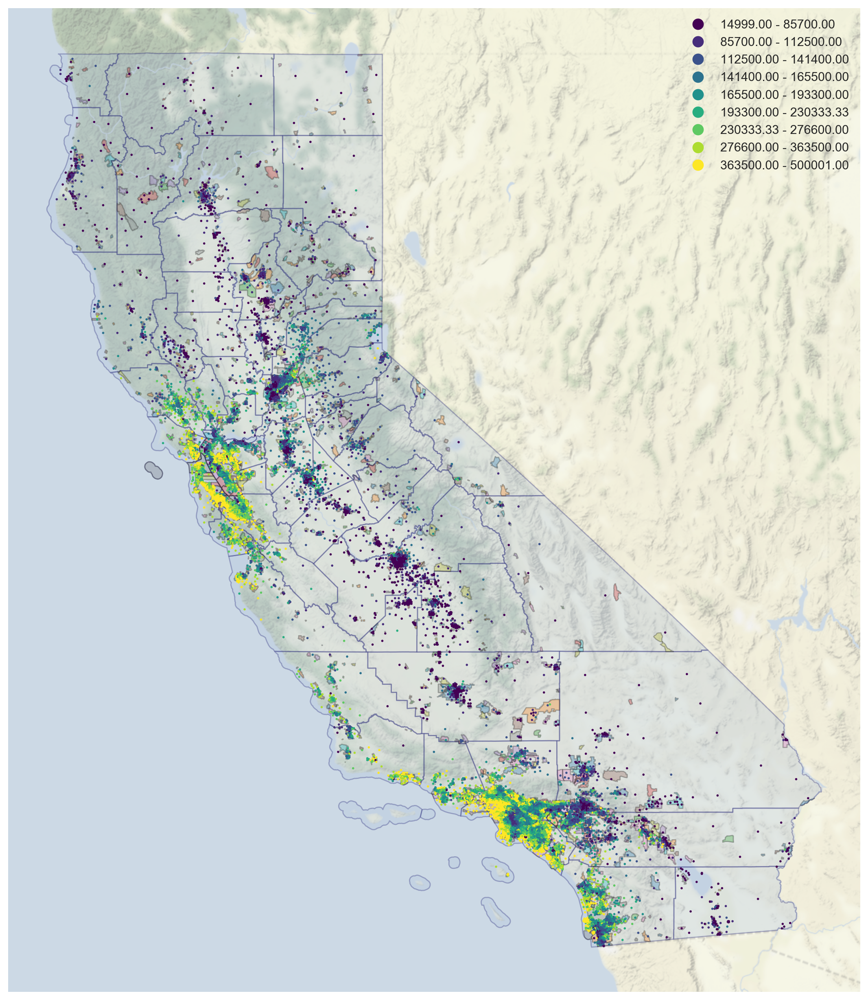

In [38]:
counties_ax = ca_counties.plot(color='lightsteelblue', edgecolor='midnightblue', alpha=.3)
counties_ax.set_axis_off()
ca_places.plot(column='places_name', edgecolor='k', alpha=.3, ax=counties_ax)
gdf.plot(column='median_house_value', scheme='quantiles', k=9, cmap='viridis', legend=True, markersize=1, ax=counties_ax)
ctx.add_basemap(counties_ax, url=ctx.sources.ST_TERRAIN_BACKGROUND, alpha=.5)
plt.show()

## Baseline Dataframe

In [26]:
# for the baseline we will drop the rows with missing values

gdf0 = gdf.dropna()
print(f'--- Missing Values ---\n{gdf0.isnull().sum()}')

--- Missing Values ---
longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
geometry              0
dtype: int64


## Visualize Dataset

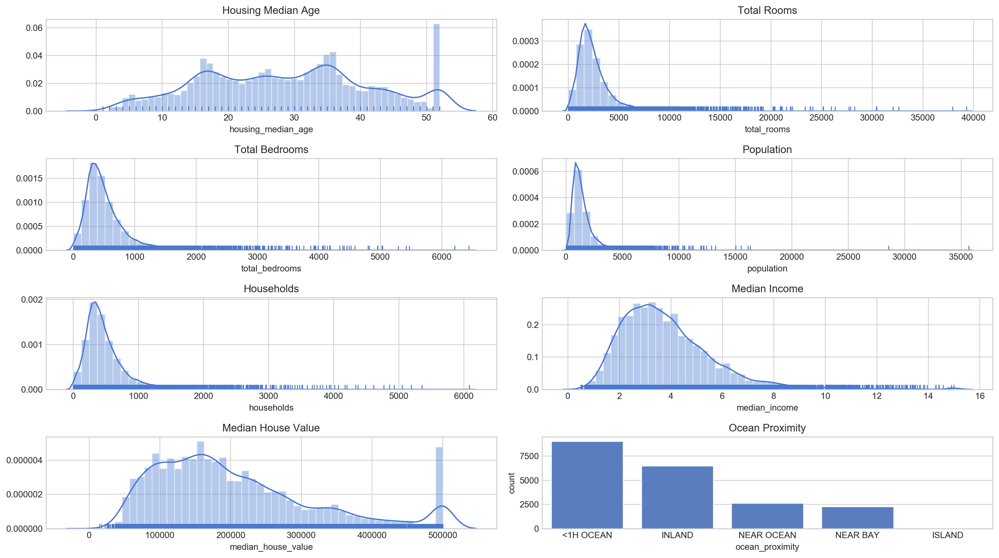

In [27]:
fig, ax = plt.subplots(4,2,figsize=(16,9))

sns.set(style='white', palette='muted', color_codes=True)

# plotted separately for fine grain control (if needed)
sns.distplot(gdf0.housing_median_age, bins=52, color='b', rug=True, ax=ax[0, 0]).set_title('Housing Median Age')
sns.distplot(gdf0.total_rooms, color='b', rug=True, ax=ax[0, 1]).set_title('Total Rooms')
sns.distplot(gdf0.total_bedrooms, color='b', rug=True, ax=ax[1, 0]).set_title('Total Bedrooms')
sns.distplot(gdf0.population, color='b', rug=True, ax=ax[1, 1]).set_title('Population')
sns.distplot(gdf0.households, color='b', rug=True, ax=ax[2, 0]).set_title('Households')
sns.distplot(gdf0.median_income, color='b', rug=True, ax=ax[2, 1]).set_title('Median Income')
sns.distplot(gdf0.median_house_value, color='b', rug=True, ax=ax[3, 0]).set_title('Median House Value')
sns.countplot(gdf0.ocean_proximity, color='b', ax=ax[3, 1]).set_title('Ocean Proximity')

plt.tight_layout()
plt.show()

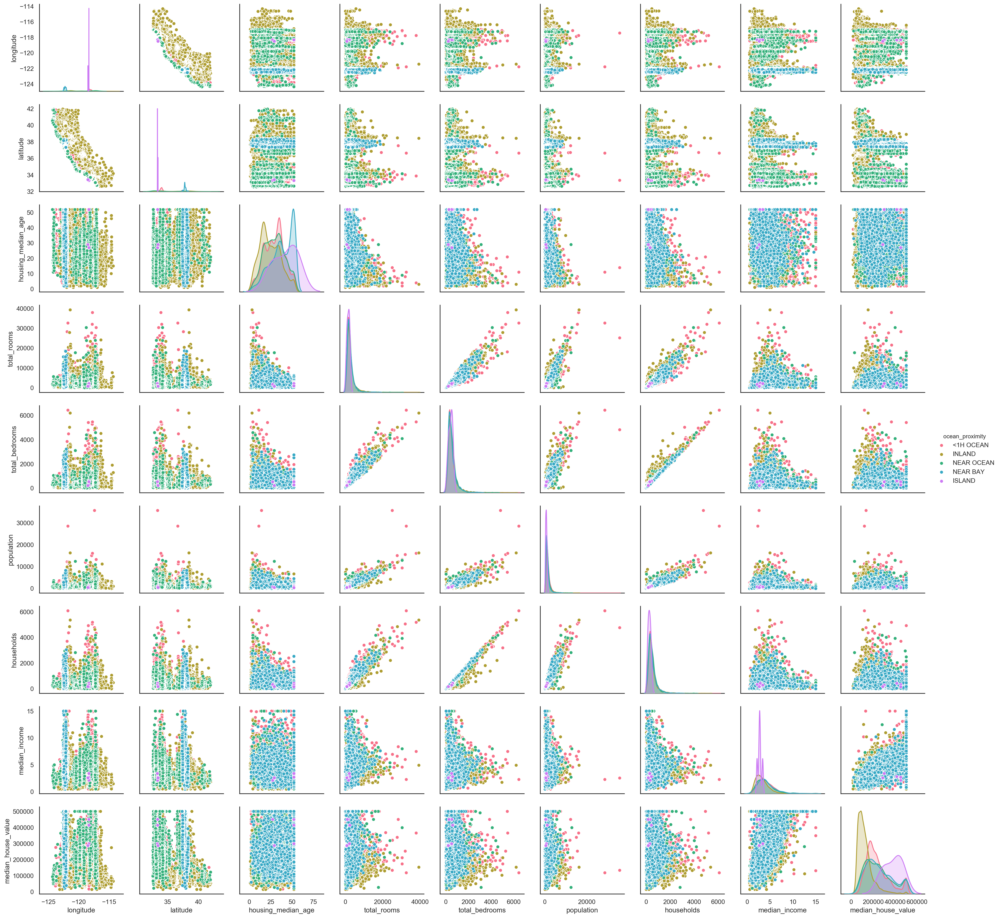

In [28]:
sns.pairplot(gdf0, hue='ocean_proximity', palette='husl')
plt.show()

# Building Baseline Model

In [29]:
#TODO: Build Baseline Model